# Check-GPU-Connect

In [1]:
print("auto connect")

auto connect


In [2]:
import torch 

print(torch.__version__) 
print(torch.cuda.is_available()) 
print(torch.cuda.get_device_name(0))

2.4.0
True
Tesla T4


In [3]:
!nvidia-smi

Fri Aug 30 07:45:48 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Content 

## Install 

In [4]:
# Install Ultralytics library
!pip install ultralytics

# Import necessary modules from Ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.83 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5845.9/8062.4 GB disk)


In [5]:
from ultralytics import YOLO

## Create root folder and organize dataset folder 

In [6]:
import os  

# Specify the name of the directory to be created  
directory_name = "root"  

# Create the directory  
try:  
    os.makedirs(directory_name)  
    print(f"Directory '{directory_name}' created successfully.")  
except FileExistsError:  
    print(f"Directory '{directory_name}' already exists.")  
except Exception as e:  
    print(f"An error occurred: {e}")

Directory 'root' already exists.


In [7]:
#@@@ Create the sub folders in data
try: 
    os.makedirs("root/data")
    for x in ["train", "val", "test"]: 
        os.makedirs(f"root/data/{x}/images")
        os.makedirs(f"root/data/{x}/labels")
except FileExistsError:  
    print(f"Directories already exists.")  

Directories already exists.


In [8]:
import shutil

def copy_all_files(dir_a, dir_b): 
    for file in sorted(os.listdir(dir_a)): 
        shutil.copy(os.path.join(dir_a, file), os.path.join(dir_b, file))

In [9]:
import os  

def list_leaf_folders(root_folder):  
    leaf_folders = []  
    for dirpath, dirnames, filenames in os.walk(root_folder):  
        # Check if the current directory has no subdirectories  
        if not dirnames:  
            leaf_folders.append(dirpath)  
    return sorted(leaf_folders) 


root_path = '/kaggle/working/root/data'   
leaf_folders = list_leaf_folders(root_path)  
print("Leaf folders:", leaf_folders)

_path = '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2'
_folders = list_leaf_folders(_path)  
print(_folders) 

Leaf folders: ['/kaggle/working/root/data/test/images', '/kaggle/working/root/data/test/labels', '/kaggle/working/root/data/train/images', '/kaggle/working/root/data/train/labels', '/kaggle/working/root/data/val/images', '/kaggle/working/root/data/val/labels']
['/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2/test/images', '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2/test/labels', '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2/train/images', '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2/train/labels', '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2/valid/images', '/kaggle/input/welding-defect-object-detection/The Welding Defect Dataset - v2/The Welding Defect Dataset - v2

In [10]:
#@@@ Copy files from input folder to root folder 
for i in range(len(leaf_folders)): 
    copy_all_files(_folders[i], leaf_folders[i])

In [11]:
import yaml

# Define the data structure for the YAML file
data = {
    'path': "/kaggle/working/root/data",
    'train': 'train',
    'val': 'val',
    'test': 'test',
    'names': ['Bad Weld', 'Good Weld', 'Defect']
}

#@@@ Construct the full path to the YAML file
output_file = os.path.join(root_path, "data.yaml")

# Write the data to the YAML file
with open(output_file, 'w') as yaml_file:
    yaml.dump(data, yaml_file)

## Train customize 

In [12]:
# Load a model
models = YOLO('yolov8n.yaml')  # build a new model from scratch
models = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)

In [14]:
os.listdir('/kaggle/working/') # after load a pre-model, it is downed to current working 

['state.db', '.virtual_documents', 'root', 'runs.zip', 'runs', 'yolov8n.pt']

In [ ]:
# _results = models.train(data=os.path.join(root_path, "data.yaml"), 
#                              model="yolov8n.pt",
#                              epochs=20, time=0.5,
#                              cache=True, 
#                              device=[0, 1],
#                              verbose=True) 

In [15]:
import shutil  

# Specify the folder to compress and the output ZIP file name  
folder_to_compress = '/kaggle/working/runs' 
output_zip_file = 'runs.zip'  

# Compress the runs to zip 
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', folder_to_compress)

'/kaggle/working/runs.zip'

In [32]:
import matplotlib.image as pltimg
import matplotlib.pyplot as plt

def show_training(folder_path):
    # List of image file extensions to look for  
    image_extensions = ('.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff')  

    # List to store image file names  
    image_files = []  

    # Iterate through the files in the specified folder  
    for filename in os.listdir(folder_path):  
        if filename.lower().endswith(image_extensions):  
            image_files.append(filename)
    
    print(sorted(image_files))
    for file in sorted(image_files): 
        path = os.path.join(folder_path, file)
        image = pltimg.imread(path)
        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.axis("off")
        plt.show() 

['F1_curve.png', 'PR_curve.png', 'P_curve.png', 'R_curve.png', 'confusion_matrix.png', 'confusion_matrix_normalized.png', 'labels.jpg', 'labels_correlogram.jpg', 'results.png', 'train_batch0.jpg', 'train_batch1.jpg', 'train_batch1020.jpg', 'train_batch1021.jpg', 'train_batch1022.jpg', 'train_batch2.jpg', 'val_batch0_labels.jpg', 'val_batch0_pred.jpg', 'val_batch1_labels.jpg', 'val_batch1_pred.jpg', 'val_batch2_labels.jpg', 'val_batch2_pred.jpg']


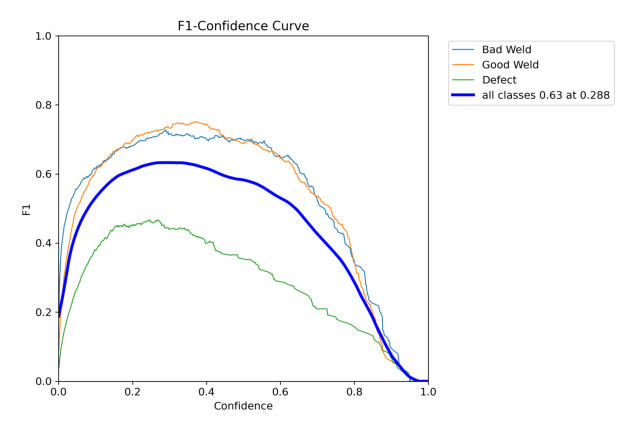

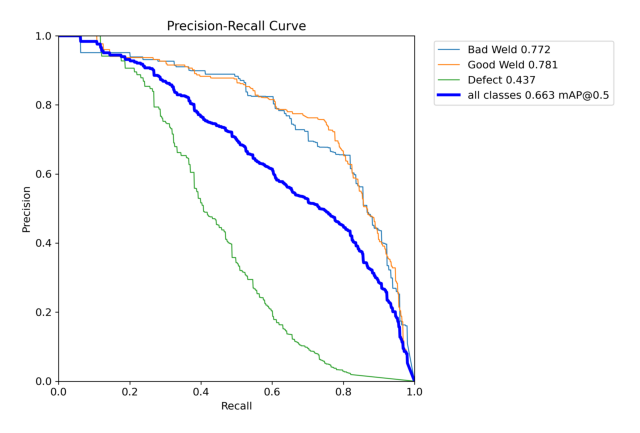

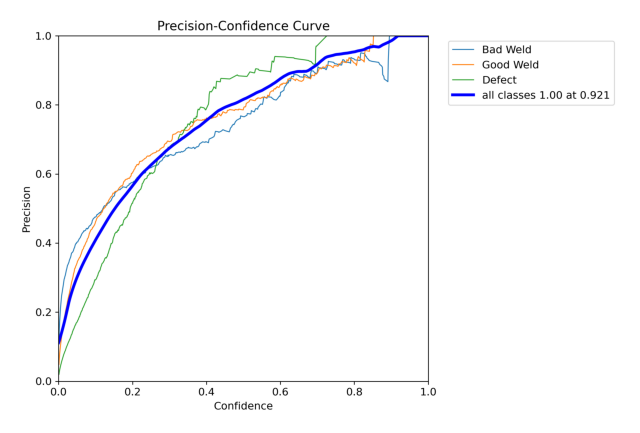

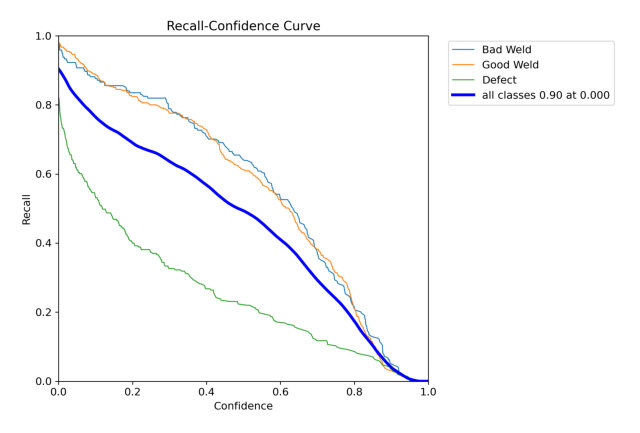

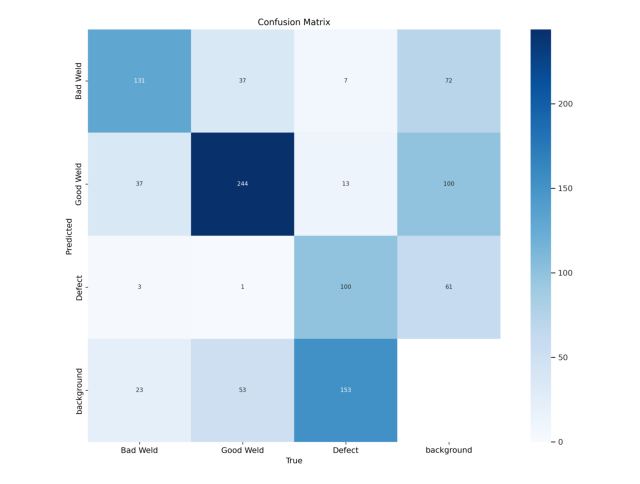

...

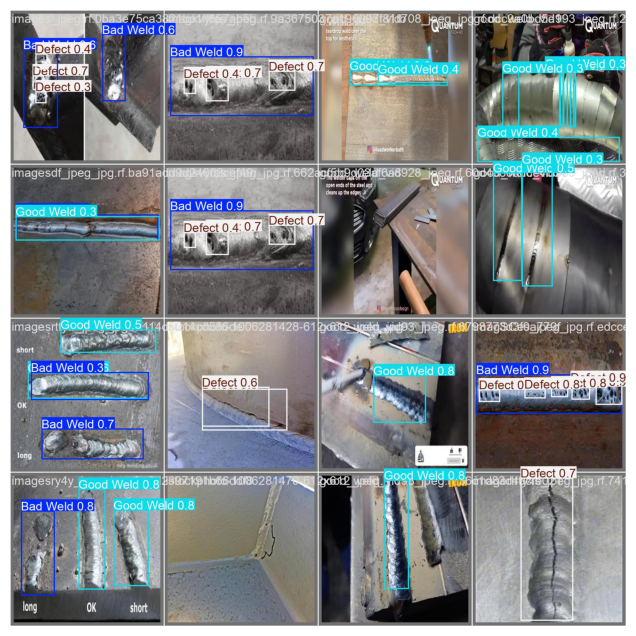

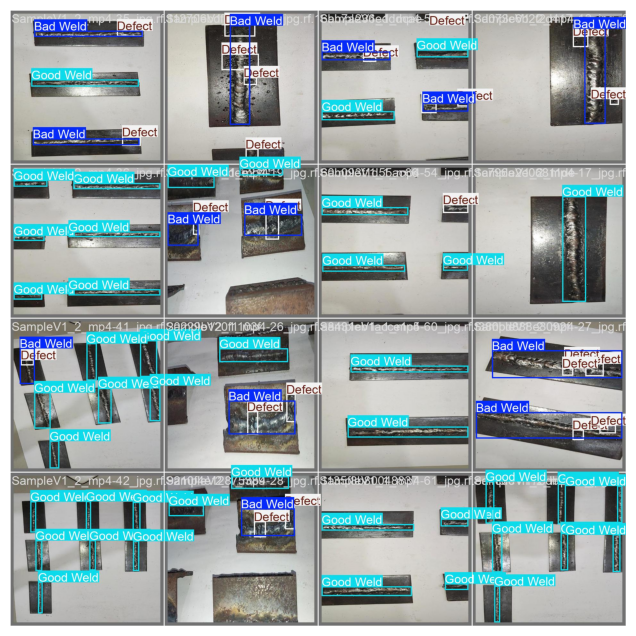

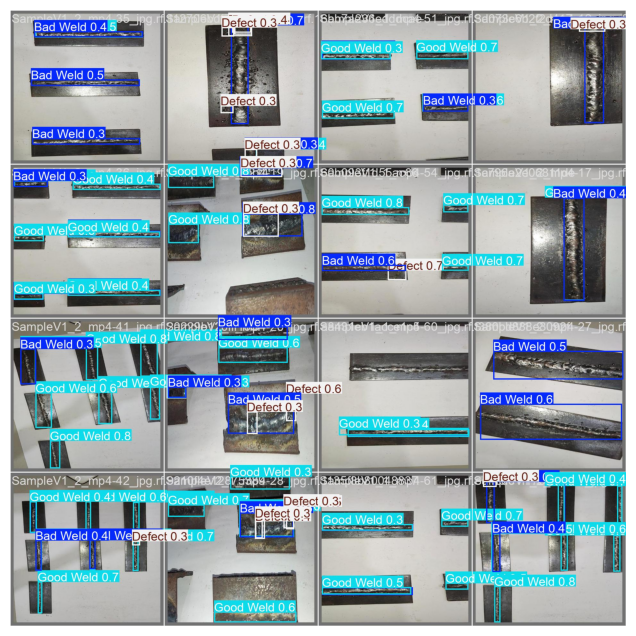

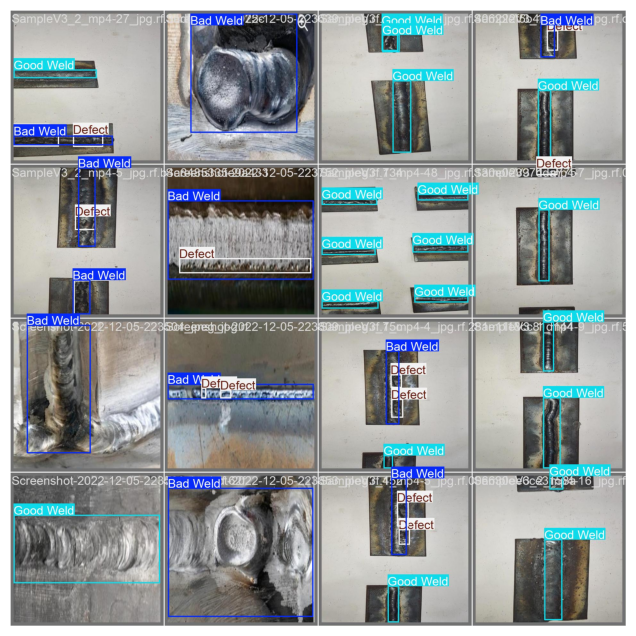

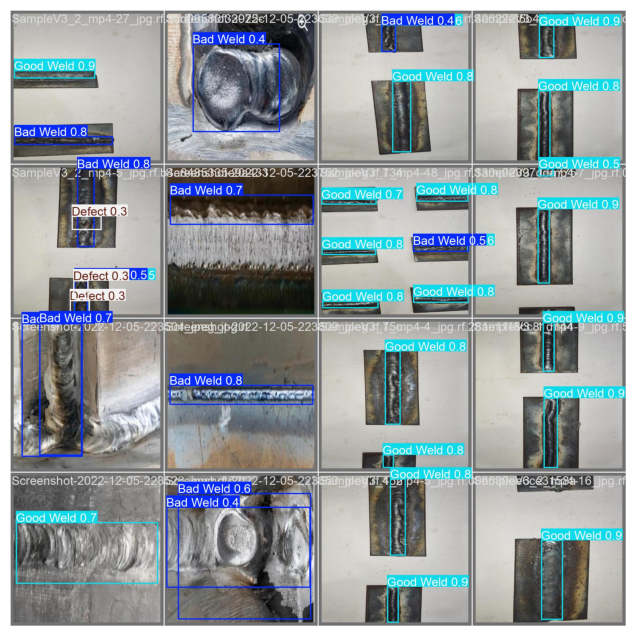

In [33]:
#@@@ Show the training process and result
show_training(os.path.join(os.getcwd(), 'runs', 'detect', 'train'))

## Evaluate 

In [35]:
link_model = os.path.join(os.getcwd(), 'runs/detect/train/weights/best.pt')
best_model = YOLO(link_model) # load from a customize trained model 

In [36]:
metrics_val = best_model.val(data=os.path.join(root_path, "data.yaml"), split='val', 
               device=[0, 1], 
               plots=False)

Ultralytics YOLOv8.2.83 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                      CUDA:1 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 15.0MB/s]
val: Scanning /kaggle/working/root/data/val/labels.cache... 283 images, 0 backgrounds, 0 corrupt: 100%|██████████| 283/283 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:03<00:00,  5.14it/s]


                   all        283        802      0.678       0.63      0.664      0.418
              Bad Weld        141        194      0.657      0.788      0.773      0.514
             Good Weld        175        335      0.697      0.776      0.781      0.523
                Defect        128        273      0.681      0.326      0.437      0.216
Speed: 0.2ms preprocess, 3.8ms inference, 0.0ms loss, 1.6ms postprocess per image


In [37]:
metrics_test = best_model.val(data=os.path.join(root_path, "data.yaml"), split='test', 
               device=[0, 1], 
               plots=True)

Ultralytics YOLOv8.2.83 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                      CUDA:1 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/root/data/test/labels.cache... 126 images, 0 backgrounds, 0 corrupt: 100%|██████████| 126/126 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]


                   all        126        301      0.579      0.512      0.551      0.353
              Bad Weld         63         95      0.729      0.663      0.773      0.534
             Good Weld         80        117      0.585      0.658      0.635        0.4
                Defect         43         89      0.422      0.213      0.245      0.124
Speed: 1.9ms preprocess, 4.7ms inference, 0.1ms loss, 21.9ms postprocess per image
Results saved to runs/detect/val13


### Box metric

In [46]:
metrics = metrics_test
box_me = metrics.box 
cls_me = metrics.confusion_matrix
speed_me = metrics.speed
name_class = metrics.names
print(name_class)

{0: 'Bad Weld', 1: 'Good Weld', 2: 'Defect'}


In [60]:
NAME_LABELS = ['Bad Weld', 'Good Weld', 'Defect']

In [59]:
def show_map(score, x=50, y=95): 
    print(f"mAP@{x}-{y}") 
    print(f"conf from 0 to 1, and iou from {x} to {y} is: {score:.4f}")
    
show_map(box_me.map)
show_map(box_me.map50, 50, 50)
show_map(box_me.map75, 75, 75)

mAP@50-95
conf from 0 to 1, and iou from 50 to 95 is: 0.3528
[    0.53405      0.4003     0.12397]
mAP@50-50
conf from 0 to 1, and iou from 50 to 50 is: 0.5509
mAP@75-75
conf from 0 to 1, and iou from 75 to 75 is: 0.3904


[    0.53405      0.4003     0.12397]


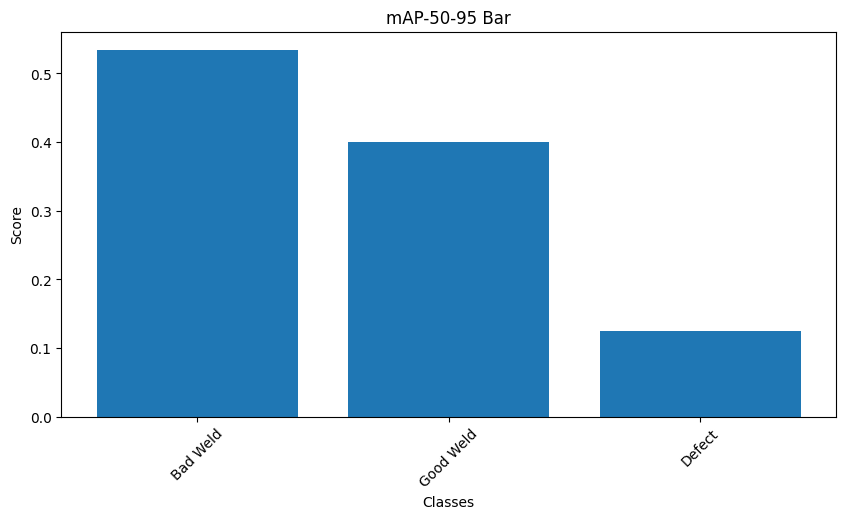

In [64]:
print(box_me.maps) 
plt.figure(figsize=(10, 5))
plt.bar(NAME_LABELS, box_me.maps)
plt.title('mAP-50-95 Bar')
plt.xlabel('Classes')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.show()

### Cls metric 

[         95         117          89         118]
[[         59          10           4          22]
 [         26          79           2          37]
 [          0           0          22          59]
 [         10          28          61           0]]


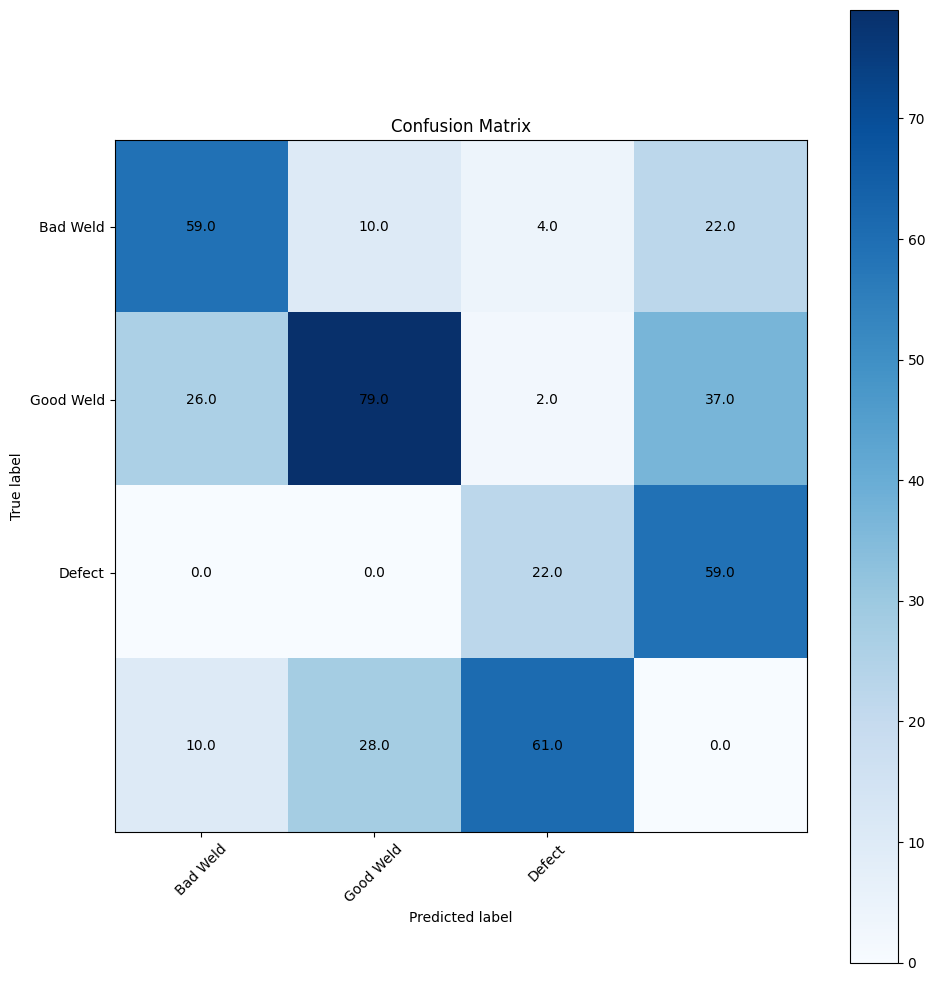

Evaluate at IOU threshold is: ***
Class: Bad Weld
	 Not fits: 0.1053, Wrong cls: 0.2737
	 Precision: 0.6211
	 Recall: 0.6211
	 #Instances: 95.0
Class: Good Weld
	 Not fits: 0.2393, Wrong cls: 0.2121
	 Precision: 0.6752
	 Recall: 0.5486
	 #Instances: 117.0
Class: Defect
	 Not fits: 0.6854, Wrong cls: 0.0430
	 Precision: 0.2472
	 Recall: 0.2716
	 #Instances: 89.0


In [76]:
import numpy as np
import matplotlib.pyplot as plt


# Get the confusion matrix from the metrics object
cm = cls_me.matrix

# Calculate precision and recall for each class
true_positives = np.diag(cm)
false_positives = np.sum(cm, axis=0) - true_positives
false_negatives = np.sum(cm, axis=1) - true_positives

precision = true_positives / (true_positives + false_positives)
recall = true_positives / (true_positives + false_negatives)
# Calculate the number of instances for each class
instances_per_class = np.sum(cm, axis=0)
print(instances_per_class)
print(cm)


# Display the confusion matrix with values
# Plot the confusion matrix
plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(NAME_LABELS))
plt.xticks(tick_marks, NAME_LABELS, rotation=45)
plt.yticks(tick_marks, NAME_LABELS)
plt.ylabel('True label')
plt.xlabel('Predicted label')

# Add labels to each cell
for i in range(len(cm)):
    for j in range(len(cm)):
        plt.text(j, i, str(cm[i, j]), ha='center', va='center', color='black')

plt.tight_layout()
plt.show()
        

# Display the precision and recall for each class
print("Evaluate at IOU threshold is: ***")
for i, class_name in enumerate(NAME_LABELS):
    print(f"Class: {class_name}")
    not_fit = cm[len(NAME_LABELS), i] / instances_per_class[i]
    wrong_cls = 1.0 - recall[i] - not_fit
    print(f"\t Not fits: {not_fit:.4f}, Wrong cls: {wrong_cls:.4f}")
    print(f"\t Precision: {precision[i]:.4f}")
    print(f"\t Recall: {recall[i]:.4f}")
    print(f"\t #Instances: {instances_per_class[i]}")

### Evaluate overview

In [78]:
os.listdir(os.path.join(os.getcwd(), 'runs', 'detect', 'val13'))

['val_batch2_pred.jpg',
 'F1_curve.png',
 'PR_curve.png',
 'P_curve.png',
 'val_batch1_labels.jpg',
 'val_batch2_labels.jpg',
 'confusion_matrix.png',
 'val_batch1_pred.jpg',
 'confusion_matrix_normalized.png',
 'R_curve.png',
 'val_batch0_labels.jpg',
 'val_batch0_pred.jpg']

['F1_curve.png', 'PR_curve.png', 'P_curve.png', 'R_curve.png', 'confusion_matrix.png', 'confusion_matrix_normalized.png', 'val_batch0_labels.jpg', 'val_batch0_pred.jpg', 'val_batch1_labels.jpg', 'val_batch1_pred.jpg', 'val_batch2_labels.jpg', 'val_batch2_pred.jpg']


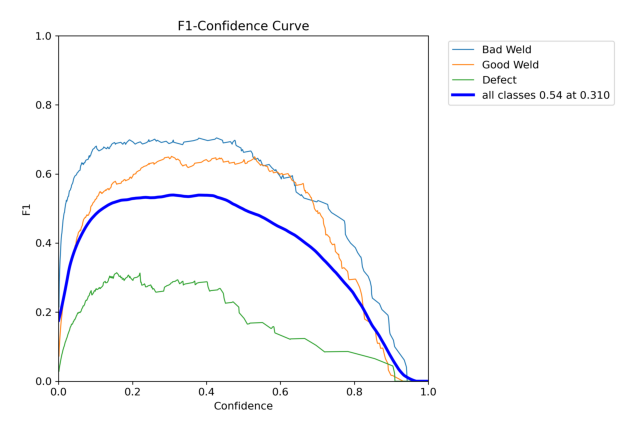

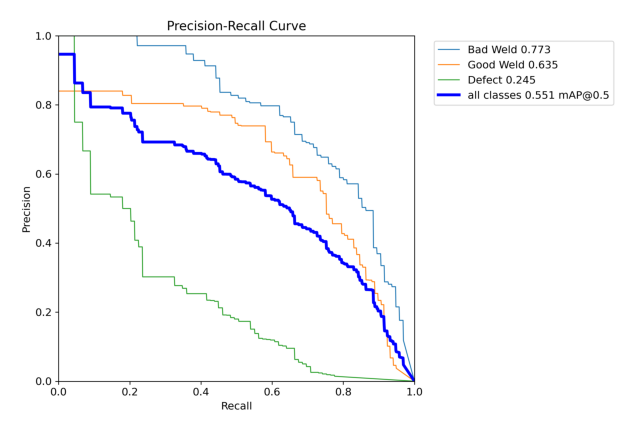

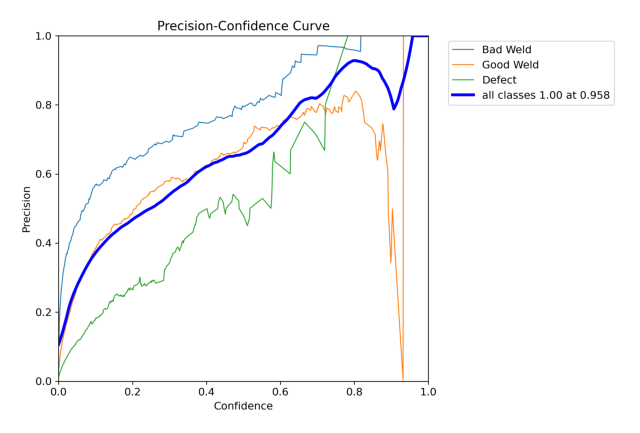

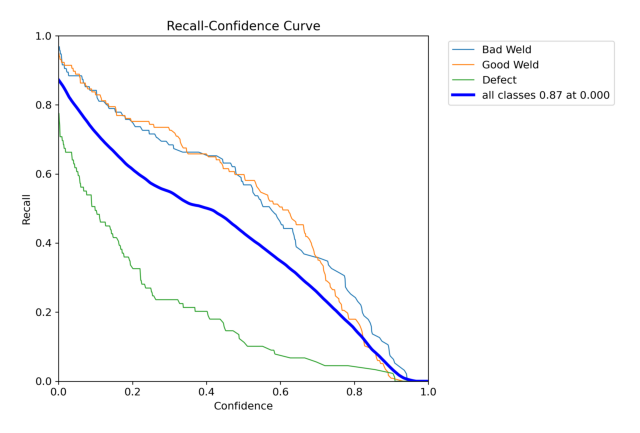

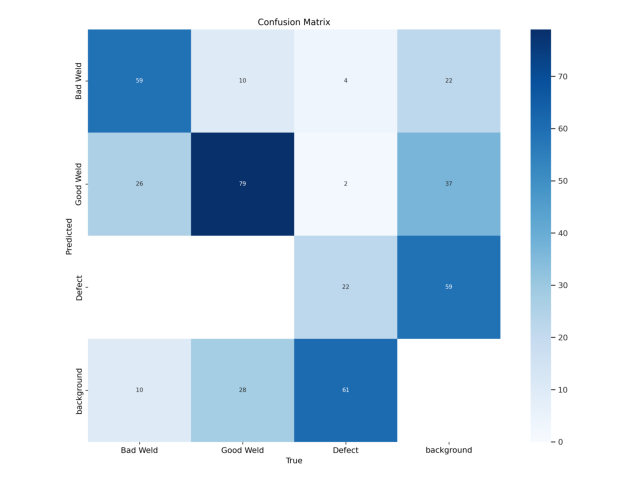

...

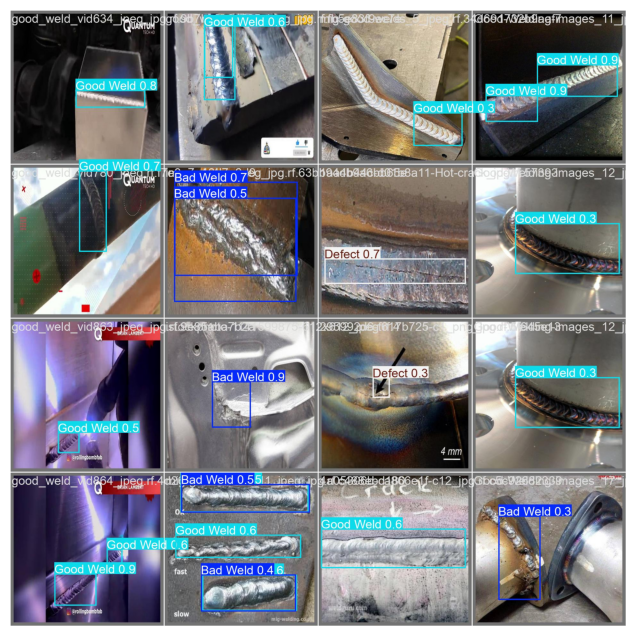

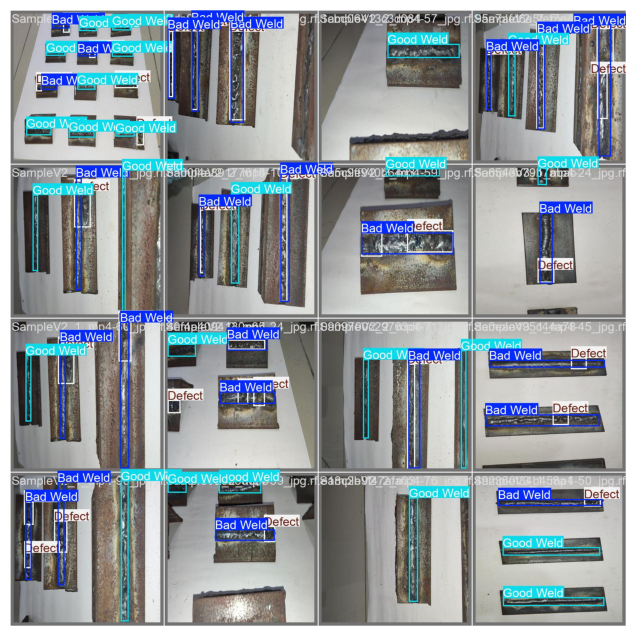

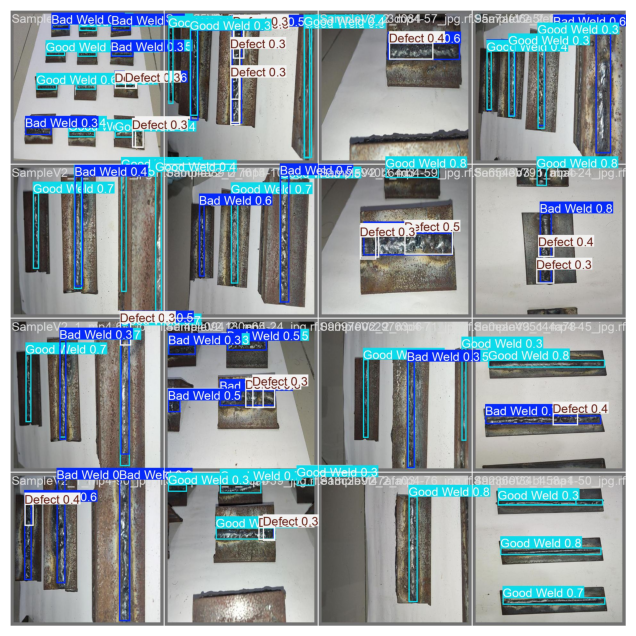

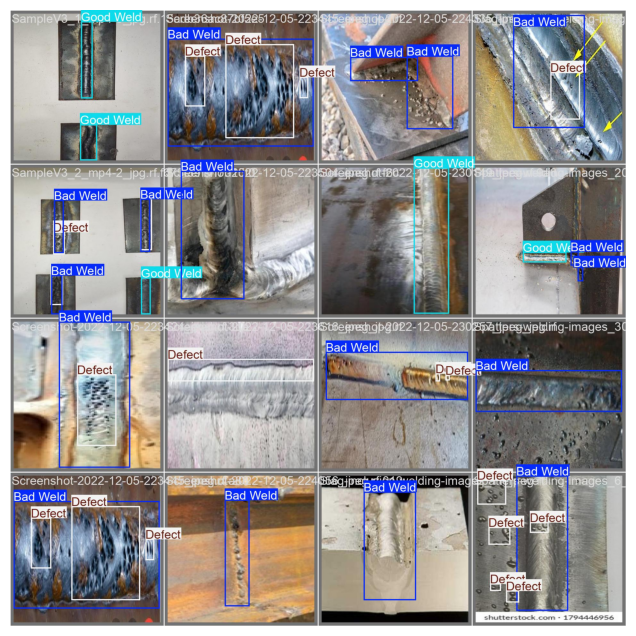

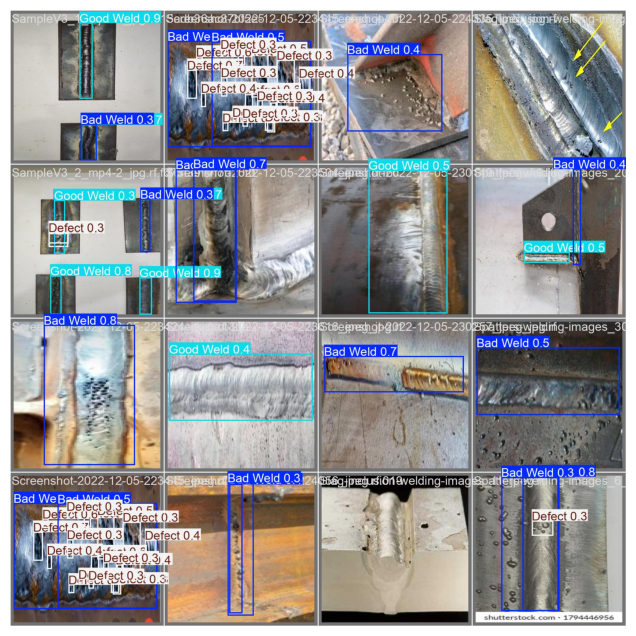

In [77]:
show_training(os.path.join(os.getcwd(), 'runs', 'detect', 'val13'))

### Speed metric

{'preprocess': 1.9422069428459046, 'inference': 4.688026413084969, 'loss': 0.05368580893864707, 'postprocess': 21.919042345077273}


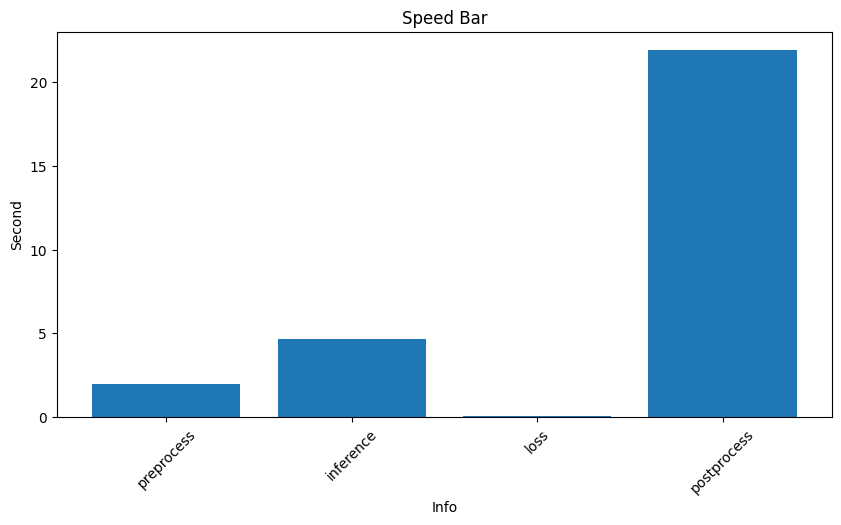

In [88]:
print(speed_me) 
plt.figure(figsize=(10, 5))
plt.bar(speed_me.keys(), [x * 1 for x in speed_me.values()])
plt.title('Speed Bar')
plt.xlabel('Info')
plt.ylabel('Second')
plt.xticks(rotation=45)
plt.show()

## Predict some testcase

In [107]:
best_model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
   